In [1]:
!pip install opencv-python pillow numpy


In [2]:
import cv2
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt


In [3]:
def show(img, title="Image"):
    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")


In [4]:
def detect_helmet(image):
    h, w, _ = image.shape

    # head region → top 20% of image (simple assumption)
    head_region = image[0:int(h*0.25), :]

    gray = cv2.cvtColor(head_region, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (7,7), 0)

    edges = cv2.Canny(blur, 50, 150)

    # Helmet → round edges + brightness
    bright = np.mean(head_region) > 130
    edge_density = np.mean(edges) > 20

    if bright and edge_density:
        return True
    else:
        return False


In [5]:
def count_persons(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Skin color range (very broad)
    lower = np.array([0, 30, 60])
    upper = np.array([20, 150, 255])

    mask = cv2.inRange(hsv, lower, upper)
    mask = cv2.dilate(mask, None, iterations=3)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Count large enough blobs
    count = 0
    for cnt in contours:
        if cv2.contourArea(cnt) > 500:
            count += 1

    return min(count, 3)   # cycling max 3


In [6]:
def detect_signal_color(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Red mask
    lower_red1 = np.array([0,100,100])
    upper_red1 = np.array([10,255,255])
    lower_red2 = np.array([160,100,100])
    upper_red2 = np.array([180,255,255])

    red_mask = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

    # Green mask
    lower_green = np.array([40,40,40])
    upper_green = np.array([90,255,255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Yellow mask
    lower_y = np.array([15,150,150])
    upper_y = np.array([35,255,255])
    yellow_mask = cv2.inRange(hsv, lower_y, upper_y)

    if np.mean(red_mask) > 10:
        return "Red Light"
    elif np.mean(green_mask) > 10:
        return "Green Light"
    elif np.mean(yellow_mask) > 10:
        return "Yellow Light"
    return "No Signal Detected"


In [7]:
def detect_violation(image_path):
    img = cv2.imread(image_path)
    h, w, _ = img.shape

    persons = count_persons(img)
    helmet = detect_helmet(img)
    signal = detect_signal_color(img)

    violations = []

    # Helmet check
    if persons >= 1 and not helmet:
        violations.append("No Helmet")

    # Triple riding
    if persons >= 3:
        violations.append("Triple Riding")
    elif persons == 2:
        violations.append("Double Riding")

    # Signal jump
    if signal == "Red Light":
        violations.append("Red Light Violation")

    return img, violations



Processing: traffic2.jpg
Detected Violations: ['No Helmet', 'Triple Riding', 'Red Light Violation']


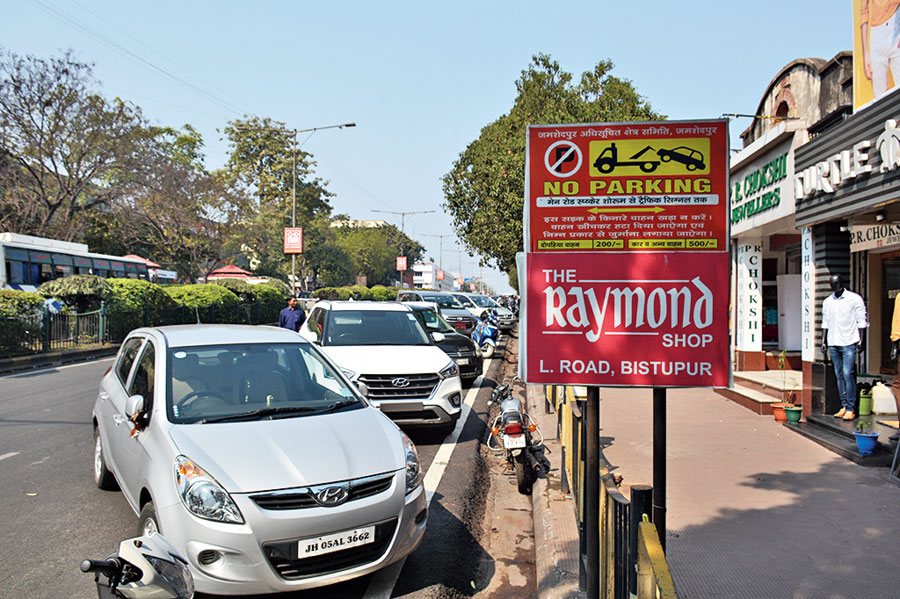


Processing: traffic1.jpg
Detected Violations: ['No Helmet', 'Triple Riding']


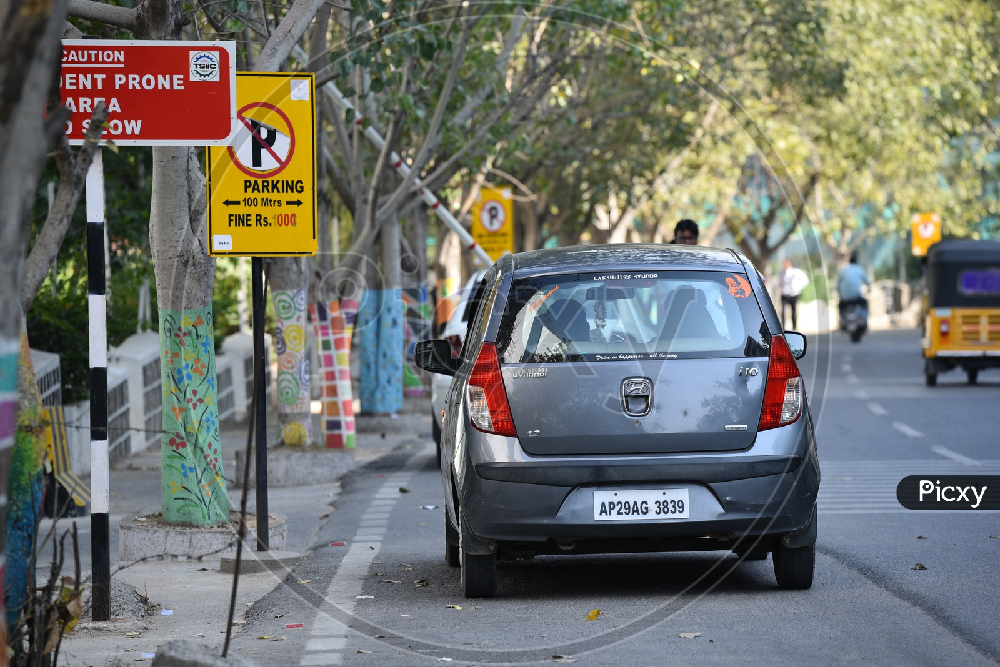


Processing: trafiic 4.jpeg
Detected Violations: ['No Helmet', 'Triple Riding']


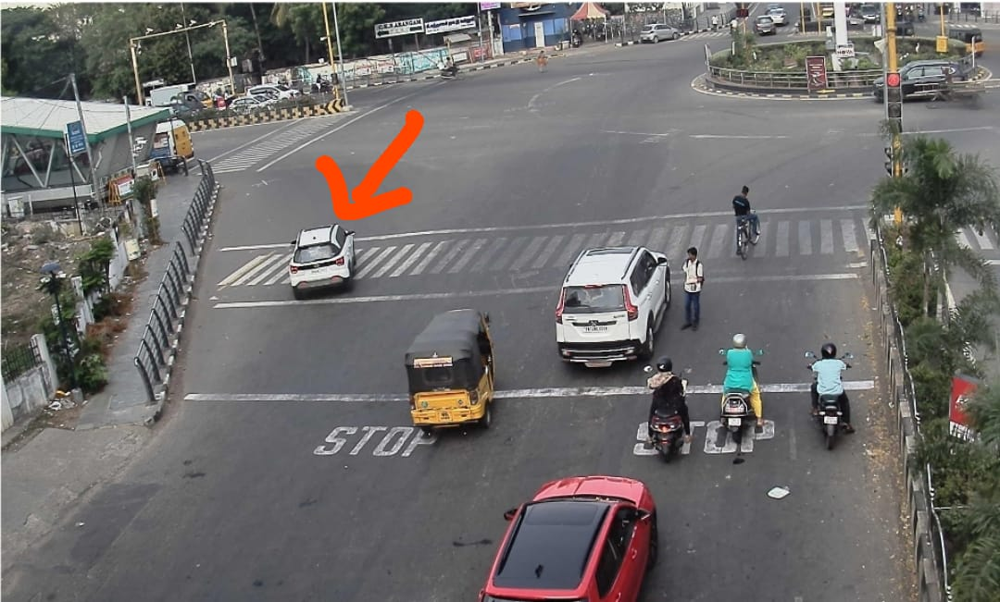


Processing: traffic 6.jpeg
Detected Violations: ['Triple Riding']


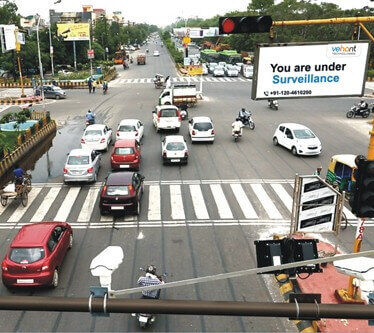


Processing: traffic 7.jpeg
Detected Violations: ['No Helmet', 'Triple Riding', 'Red Light Violation']


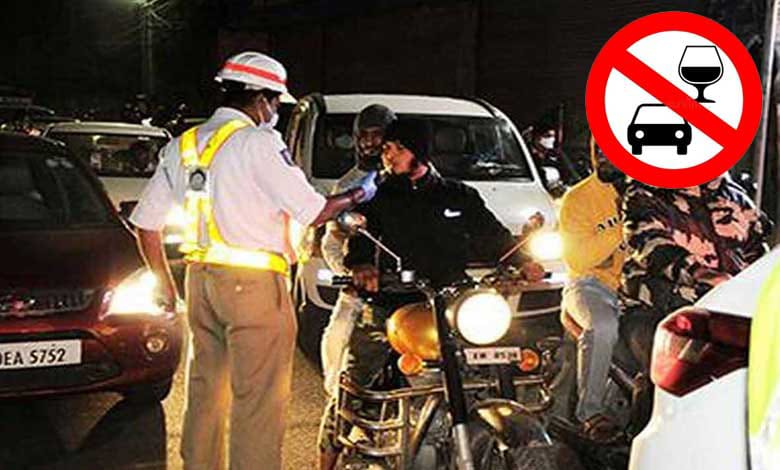


Processing: traffic 8.jpeg
Detected Violations: ['No Helmet', 'Triple Riding']


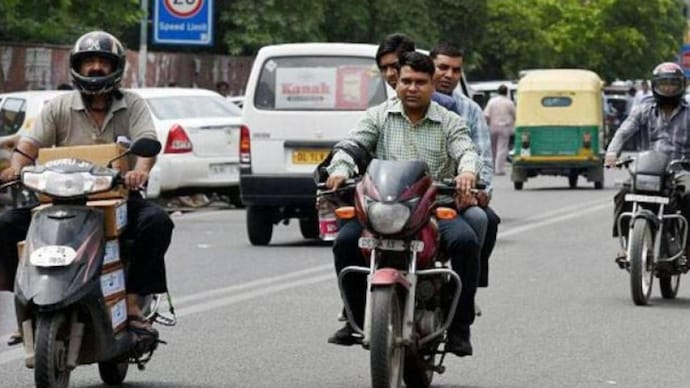


Processing: traffic 5.jpeg
Detected Violations: ['No Helmet', 'Triple Riding']


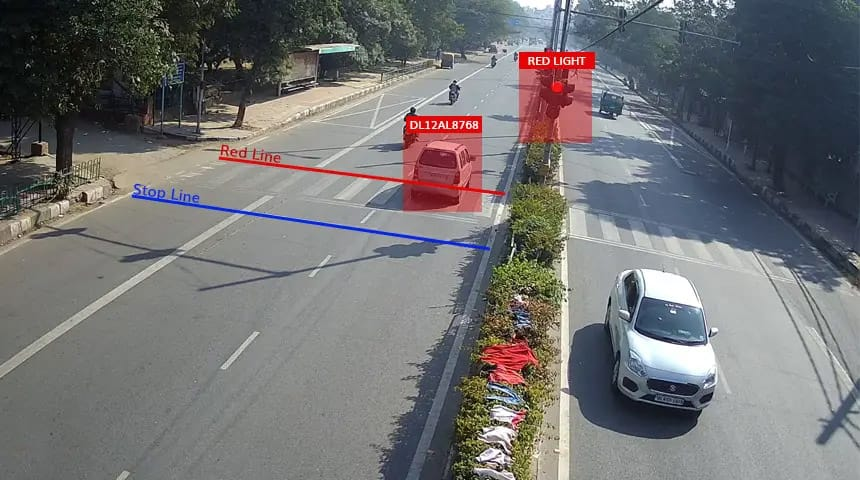


Processing: traffic 9.jpeg
Detected Violations: ['No Helmet', 'Triple Riding']


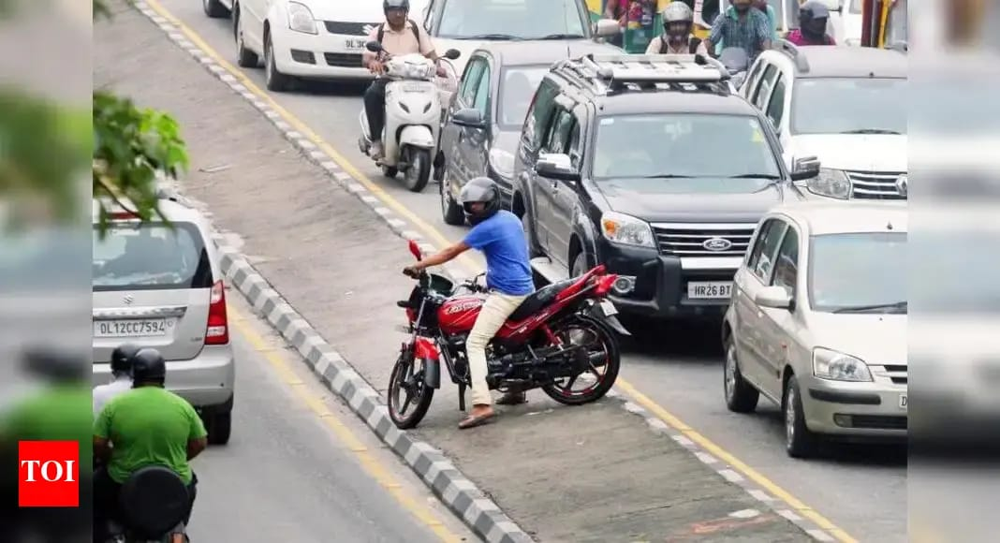


Processing: traffic 3.jpg
Detected Violations: ['No Helmet', 'Triple Riding']


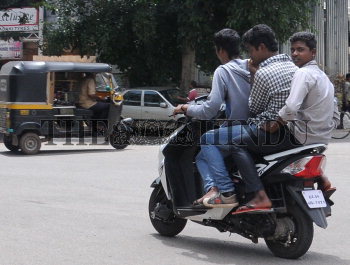

In [11]:
import os
import cv2
from IPython.display import display, Image
from PIL import Image as PILImage

# 🔍 Folder that has your 9 images
folder_path = "/Users/divyanshchoudhary/Downloads/minor project/images"

# 🔁 Loop through all images in the folder
for filename in os.listdir(folder_path):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        
        image_path = os.path.join(folder_path, filename)
        print(f"\nProcessing: {filename}")

        try:
            # Run your detection function
            img, violations = detect_violation(image_path)

            print("Detected Violations:", violations)

            # Convert OpenCV image (BGR → RGB)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            pil_img = PILImage.fromarray(img_rgb)

            # Display the image inside notebook
            display(pil_img)

        except Exception as e:
            print(f"❌ Error processing {filename}: {e}")
